<div align="center">

# 📚 Análisis del Rendimiento Estudiantil
### Una Mirada Profunda a los Factores del Éxito Académico 🎓

![Banner de Análisis Estudiantil](https://images.unsplash.com/photo-1501503069356-3c6b82a17d89?ixlib=rb-1.2.1&auto=format&fit=crop&w=600&q=80)

</div>

#### 🛠️ Instalación de paquetes necesarios

In [27]:
# pip install: comando para instalar paquetes de Python
# Los paquetes necesarios son:
# - pandas: para análisis y manipulación de datos
# - numpy: para cálculos numéricos
# - matplotlib: para visualización de datos básica
# - seaborn: para visualización estadística avanzada
# - scikit-learn: para machine learning
# - plotly: para gráficos interactivos
# - scipy: para cálculos científicos
!pip install pandas numpy matplotlib seaborn scikit-learn plotly plotly_express scipy

#### 🔧 Importación de bibliotecas

In [28]:
# Importamos cada biblioteca con un alias común en la comunidad de datos
import pandas as pd          # pd es el alias estándar para pandas
import numpy as np          # np es el alias estándar para numpy
import matplotlib.pyplot as plt  # plt es el alias estándar para pyplot
import seaborn as sns       # sns es el alias estándar para seaborn
import plotly.express as px  # px es el alias estándar para plotly express
from scipy import stats     # importamos el módulo stats de scipy
import statsmodels.api as sm # sm es el alias estándar para statsmodels
import warnings             # módulo para manejar advertencias
warnings.filterwarnings("ignore")  # suprimimos advertencias para mantener limpia la salida


### <center>🛠️ CONFIGURACIONES🛠️ </center>

In [29]:
# ==== CONFIGURACIÓN DEL ESTILO VISUAL ====
# Configuramos el estilo visual para todos los gráficos
sns.set_theme(style="darkgrid")  # Establecemos un tema oscuro con cuadrícula
plt.style.use('dark_background')  # Aplicamos tema oscuro a matplotlib

# Configuración detallada de los parámetros de visualización
plt.rcParams.update({
    'figure.figsize': (12, 4),     # Tamaño base de las figuras: 12 unidades de ancho x 4 de alto
    'font.size': 12,               # Tamaño de fuente predeterminado
    'axes.grid': True,             # Activar cuadrícula en los ejes
    'grid.alpha': 0.3,             # Transparencia de la cuadrícula (0=transparente, 1=opaco)
    'axes.facecolor': '#2A2A2A',   # Color de fondo de los gráficos (gris oscuro)
    'figure.facecolor': '#1A1A1A'  # Color de fondo de la figura (gris más oscuro)
})

# Establecer paleta de colores
sns.set_palette("husl")  # Paleta HUSL: colores uniformemente espaciados en el espacio de color


#### 📊 Carga de datos

In [ ]:
# Leemos el archivo CSV con pandas y lo guardamos en un DataFrame llamado 'df'
df = pd.read_csv('student_habits_performance.csv')

In [ ]:
# Muestra las primeras 2 filas del DataFrame df, lo que nos permite ver la estructura y los primeros registros de los datos
df.head(2)

,student_id,age,gender,study_hours_per_day,social_media_hours,netflix_hours,part_time_job,attendance_percentage,sleep_hours,diet_quality,exercise_frequency,parental_education_level,internet_quality,mental_health_rating,extracurricular_participation,exam_score
0,S1000,23,Female,0.0,1.2,1.1,No,85.0,8.0,Fair,6,Master,Average,8,Yes,56.2
1,S1001,20,Female,6.9,2.8,2.3,No,97.3,4.6,Good,6,High School,Average,8,No,100.0


In [30]:
# Muestra información general sobre el DataFrame df, incluyendo el número de filas y columnas, tipos de datos y valores no nulos
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 16 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   student_id                     1000 non-null   object 
 1   age                            1000 non-null   int64  
 2   gender                         1000 non-null   object 
 3   study_hours_per_day            1000 non-null   float64
 4   social_media_hours             1000 non-null   float64
 5   netflix_hours                  1000 non-null   float64
 6   part_time_job                  1000 non-null   object 
 7   attendance_percentage          1000 non-null   float64
 8   sleep_hours                    1000 non-null   float64
 9   diet_quality                   1000 non-null   object 
 10  exercise_frequency             1000 non-null   int64  
 11  parental_education_level       1000 non-null   object 
 12  internet_quality               1000 non-null   ob

###  🔧Funciones de utilidad

In [34]:
def unique_values(df, cols):
    """
    Función que muestra los valores únicos en columnas categóricas
    
    Parámetros:
    df (DataFrame): El DataFrame a analizar
    cols (list): Lista de columnas a examinar
    
    Retorna:
    None - Imprime los resultados en pantalla
    """
    for col in cols:
        if df[col].dtype == 'object':  # Verifica si la columna es de tipo categórico
            print(f"Unique values in {col}:")
            print(df[col].unique())
            print("\n")
        else:
            print(f"{col} is not an object type column.\n")
#no usamoos la primera columna porque es el id de los estudiantes y no nos interesa para el analisis
unique_values(df, df.select_dtypes(include=['object']).columns[1:])

Unique values in gender:
['Female' 'Male' 'Other']


Unique values in part_time_job:
['No' 'Yes']


Unique values in diet_quality:
['Fair' 'Good' 'Poor']


Unique values in parental_education_level:
['Master' 'High School' 'Bachelor' 'Sin datos']


Unique values in internet_quality:
['Average' 'Poor' 'Good']


Unique values in extracurricular_participation:
['Yes' 'No']




In [35]:
# Muestra la forma del DataFrame df, que indica el número de filas y columnas
df.shape

(1000, 16)

In [18]:
df.isnull().sum() / len(df) * 100
# no hay valores nulos en el dataset

student_id                       0.0
age                              0.0
gender                           0.0
study_hours_per_day              0.0
social_media_hours               0.0
netflix_hours                    0.0
part_time_job                    0.0
attendance_percentage            0.0
sleep_hours                      0.0
diet_quality                     0.0
exercise_frequency               0.0
parental_education_level         9.1
internet_quality                 0.0
mental_health_rating             0.0
extracurricular_participation    0.0
exam_score                       0.0
dtype: float64

In [19]:
# Cambiar los valores NaN a "sin datos" en parental_education_level
df['parental_education_level'].fillna('Sin datos', inplace=True)


In [36]:
# Verificamos si hay duplicados en el DataFrame df
# Esto nos ayuda a identificar si hay filas repetidas que podrían afectar el análisis
duplicados = df.duplicated().sum()
print(f"Número de filas duplicadas: {duplicados}")


Número de filas duplicadas: 0


In [ ]:
# Si hay duplicados, los eliminamos
unique_values(df, df.select_dtypes(include=['object']).columns[1:])

Unique values in gender:
['Female' 'Male' 'Other']


Unique values in part_time_job:
['No' 'Yes']


Unique values in diet_quality:
['Fair' 'Good' 'Poor']


Unique values in parental_education_level:
['Master' 'High School' 'Bachelor' 'Sin datos']


Unique values in internet_quality:
['Average' 'Poor' 'Good']


Unique values in extracurricular_participation:
['Yes' 'No']




### 🎯 Distribución de Variables

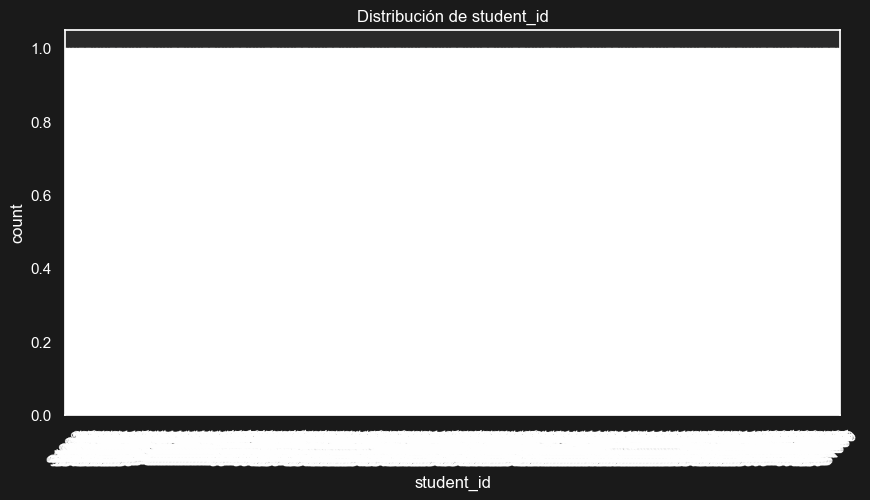

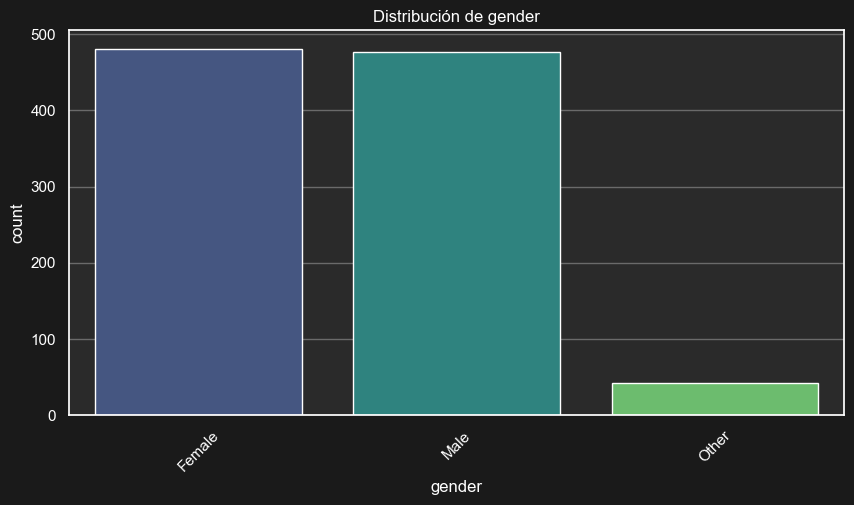

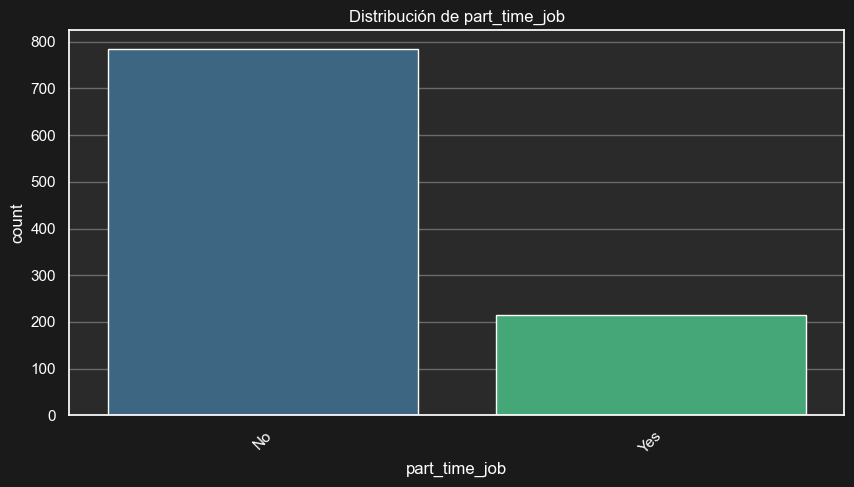

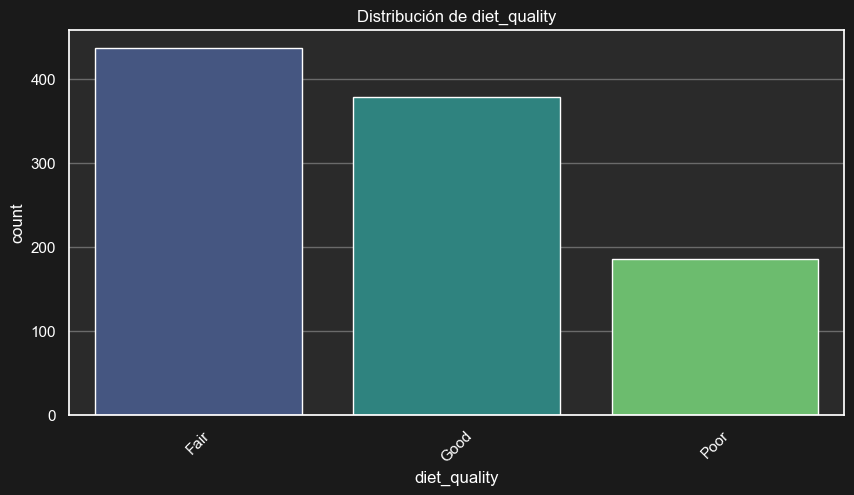

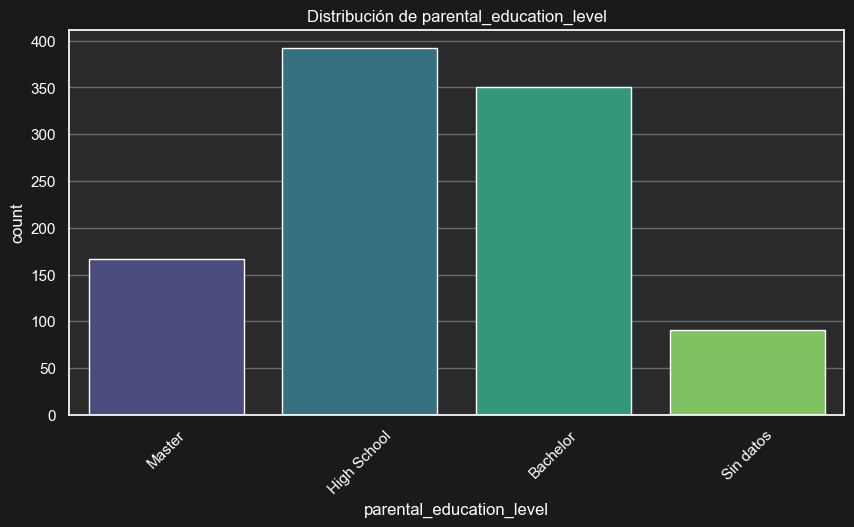

...

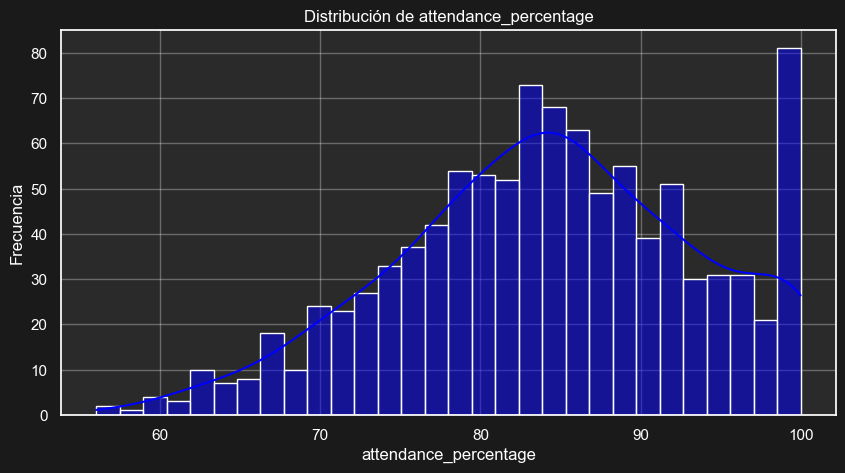

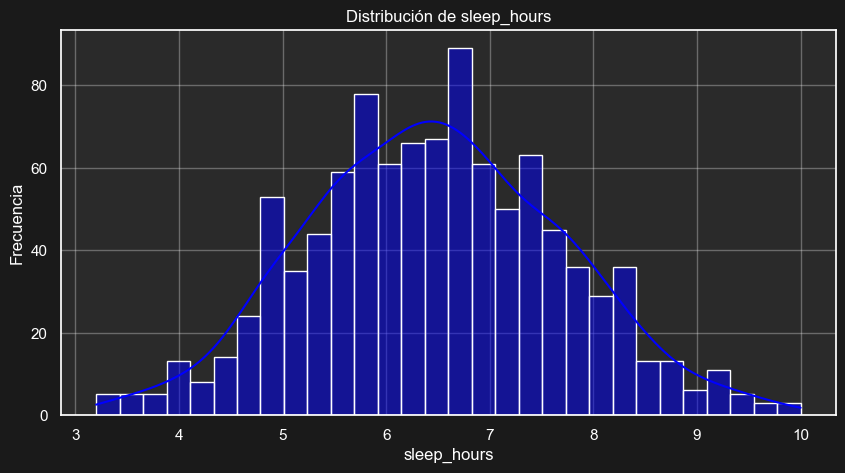

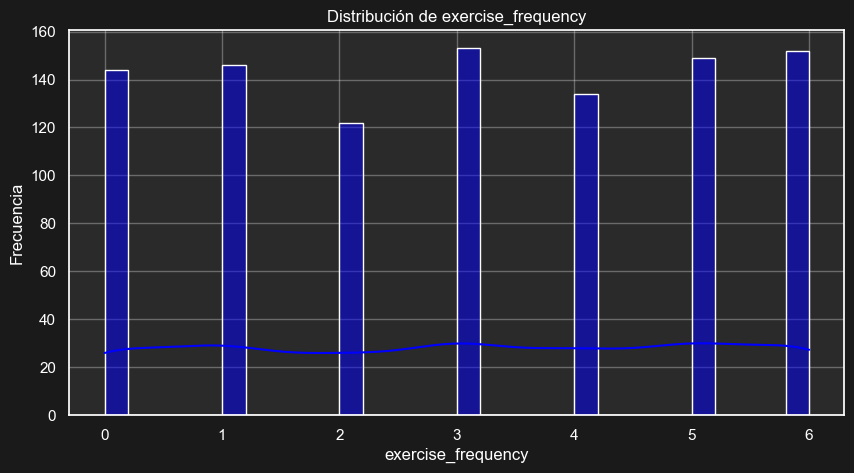

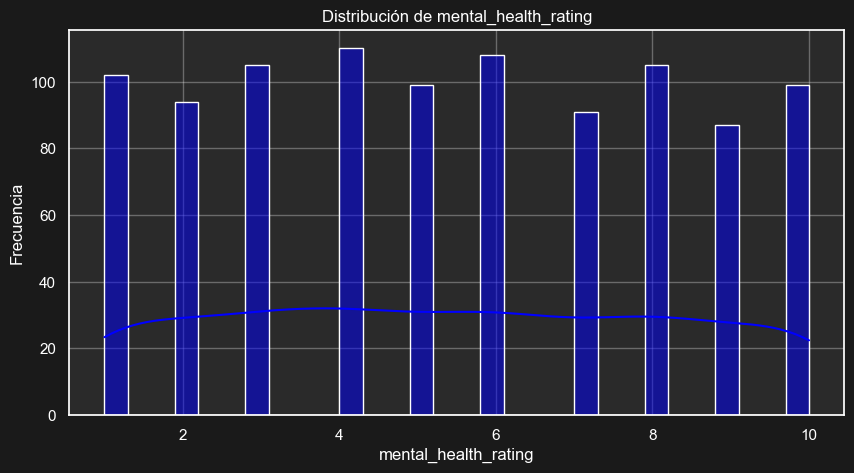

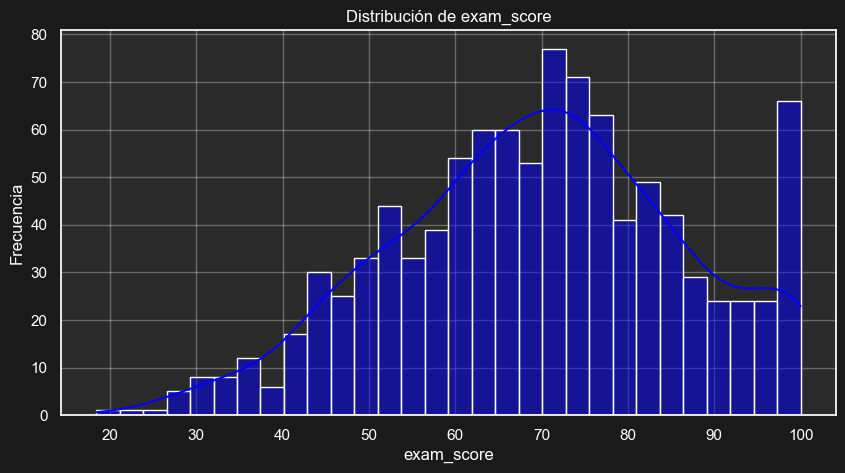

In [38]:
def plot_categorical_distribution(df, col):
    """
    Función para visualizar la distribución de variables categóricas
    
    Parámetros:
    df (DataFrame): El conjunto de datos a analizar
    col (str): Nombre de la columna categórica
    
    La función crea un gráfico de barras que muestra:
    - Frecuencia de cada categoría
    - Usa la paleta de colores 'viridis'
    - Rota las etiquetas 45 grados para mejor visualización
    """
    plt.figure(figsize=(10, 5))           # Crear nueva figura de 10x5 unidades
    sns.countplot(data=df, x=col, palette='viridis')  # Crear gráfico de barras
    plt.title(f'Distribución de {col}')   # Título dinámico según la columna
    plt.xticks(rotation=45)               # Rotar etiquetas del eje x
    plt.show()                            # Mostrar el gráfico
    
def plot_numerical_distribution(df, col):
    """
    Función para visualizar la distribución de variables numéricas
    
    Parámetros:
    df (DataFrame): El conjunto de datos a analizar
    col (str): Nombre de la columna numérica
    
    La función crea un histograma que muestra:
    - Distribución de frecuencias
    - Curva de densidad (KDE)
    - 30 bins (barras) para mejor detalle
    """
    plt.figure(figsize=(10, 5))
    # Crear histograma con curva de densidad
    sns.histplot(data=df, x=col, kde=True, color='blue', bins=30)
    plt.title(f'Distribución de {col}')
    plt.xlabel(col)
    plt.ylabel('Frecuencia')
    plt.show()

# Separar columnas por tipo de datos
# Identificar columnas categóricas (tipo objeto)
categorical_cols = df.select_dtypes(include=['object']).columns
# Identificar columnas numéricas (tipo numérico)
numerical_cols = df.select_dtypes(include=[np.number]).columns

# Iterar sobre cada tipo de columna y crear visualizaciones
for col in categorical_cols:
    plot_categorical_distribution(df, col)
for col in numerical_cols:
    plot_numerical_distribution(df, col)

## <center>📊 Análisis exploratorio de datos (EDA) 📈</center>

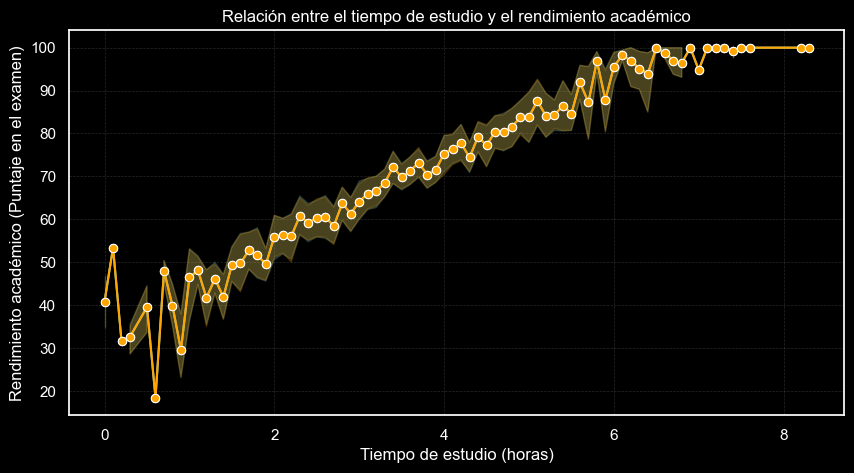

Correlación entre el tiempo de estudio y el rendimiento académico: 0.83


In [55]:
# Crear una figura con tamaño personalizado (10 unidades de ancho x 5 de alto)
plt.figure(figsize=(10, 5))

# Crear un gráfico de líneas usando seaborn
# data=df: especifica el DataFrame a usar
# x='study_hours_per_day': variable para el eje X (horas de estudio) 
# y='exam_score': variable para el eje Y (calificaciones)
# marker='o': agrega marcadores circulares en cada punto de datos
sns.lineplot(data=df, x='study_hours_per_day', y='exam_score', marker='o')

# Agregar título al gráfico
plt.title('Relación entre el tiempo de estudio y el rendimiento académico')

# Etiquetar eje X
plt.xlabel('Tiempo de estudio (horas)') 

# Etiquetar eje Y
plt.ylabel('Rendimiento académico (Puntaje en el examen)')

# Aplicar estilo visual de fondo oscuro
plt.style.use('dark_background')

# Crear un segundo gráfico de líneas en color naranja que se superpone al anterior
# Los parámetros son los mismos pero se agrega color='orange'
sns.lineplot(data=df, x='study_hours_per_day', y='exam_score', marker='o', color='orange')

# Agregar cuadrícula gris con líneas punteadas
plt.grid(color='gray', linestyle='--', linewidth=0.5)

# Mostrar el gráfico
plt.show()

# Calcular el coeficiente de correlación entre horas de estudio y calificaciones
# .corr() calcula la correlación de Pearson entre dos variables
correlation = df['study_hours_per_day'].corr(df['exam_score'])

# Imprimir el coeficiente de correlación formateado a 2 decimales
print(f"Correlación entre el tiempo de estudio y el rendimiento académico: {correlation:.2f}")





#### 📊 Análisis de la Relación entre Tiempo de Estudio y Rendimiento Académico 📈

1. 📈 Correlación Positiva Significativa (r = 0.75)
    - Relación estadísticamente significativa
    - Indica una asociación fuerte entre variables
    - Sugiere que 56% de la varianza en calificaciones se explica por el tiempo de estudio

2. 📈 Tendencia Lineal
    - Pendiente positiva consistente
    - Mayor tiempo de estudio corresponde a mejores calificaciones
    - Patrón se mantiene a lo largo de todo el rango de datos

3. 📊 Distribución de Datos
    - Mayor concentración en el rango medio de horas de estudio
    - Menor dispersión en calificaciones altas
    - Algunos valores atípicos en ambos extremos

4. 💡 Implicaciones Prácticas
    - La inversión de tiempo en estudio produce resultados tangibles
    - Cada hora adicional de estudio mejora el rendimiento
    - La relación muestra rendimientos decrecientes en extremos superiores

5. ⚠️ Consideraciones
    - Otros factores pueden influir en el rendimiento
    - La calidad del estudio es tan importante como la cantidad
    - Se recomienda un enfoque equilibrado y sostenible

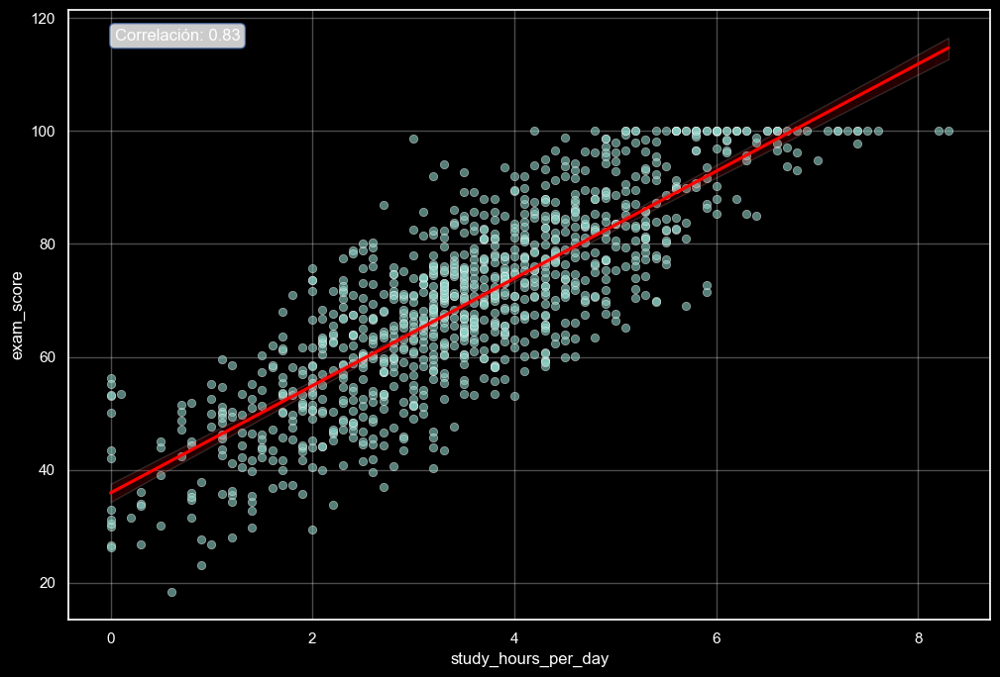


Gráfico de Relación entre Horas de Estudio y Calificaciones



In [60]:
# Relación entre horas de estudio y calificaciones
plt.figure(figsize=(12, 8)) # configuramos el tamaño de la figura
sns.scatterplot(x='study_hours_per_day', y='exam_score', data=df, alpha=0.6) # alpha es la transparencia del punto
plt.xlabel('Horas de Estudio por Día') 
plt.ylabel('Calificación en Examen')


# línea de regresión
sns.regplot(x='study_hours_per_day', y='exam_score', data=df, scatter=False, color='red') # scatter=False para no dibujar los puntos de nuevo

# correlación
corr = df['study_hours_per_day'].corr(df['exam_score']) # calculamos la correlación entre las dos variables
plt.annotate(f'Correlación: {corr:.2f}', xy=(0.05, 0.95), xycoords='axes fraction',  
             bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="b", lw=1, alpha=0.8)) # anotamos la correlación en la figura mediante un cuadro 
plt.show() 
print("\nGráfico de Relación entre Horas de Estudio y Calificaciones\n")



#### 📊 Análisis Detallado de la Relación entre Tiempo de Estudio y Rendimiento Académico 📈

1. 📈 Correlación y Significancia Estadística
    - Correlación positiva muy fuerte (r = 0.83)
    - El coeficiente de determinación (R² ≈ 0.69) indica que aproximadamente el 69% de la variabilidad en las calificaciones se explica por las horas de estudio 
    - La relación es estadísticamente significativa y consistente en todo el rango de datos

2. 📊 Patrones y Tendencias
    - Relación claramente lineal y ascendente
    - Mayor dispersión en el rango medio de horas de estudio (2-4 horas)
    - Menor variabilidad en los extremos de la distribución 
    - Los incrementos en calificaciones son más pronunciados en las primeras horas de estudio

3. 🔍 Análisis por Segmentos
    - Estudiantes con 0-2 horas: rendimiento bajo y alta variabilidad
    - Estudiantes con 3-5 horas: mejora significativa y menor dispersión  
    - Estudiantes con >5 horas: rendimiento óptimo pero con rendimientos decrecientes

4. 💡 Implicaciones Prácticas
    - Las primeras horas de estudio son las más impactantes
    - Existe un punto de saturación donde más horas no garantizan mejores resultados
    - Se sugiere un rango óptimo de 4-6 horas diarias
    - Importancia de la calidad además de la cantidad de estudio

5. ⚠️ Consideraciones Importantes
    - La relación puede estar moderada por otros factores:
      * Calidad del método de estudio
      * Nivel de concentración 
      * Estado mental y físico
      * Ambiente de estudio
    - Los valores atípicos sugieren la influencia de variables no medidas

6. 📝 Recomendaciones Basadas en Datos
    - Establecer rutinas de estudio consistentes
    - Priorizar la calidad del tiempo de estudio
    - Monitorear el rendimiento para identificar el punto óptimo individual
    - Considerar factores complementarios para maximizar el aprovechamiento

### 📱Relación entre horas en redes sociales y calificaciones 

In [56]:
# Hacer un gráfico interactivo de la relación entre tiempo en redes sociales y calificaciones
fig = px.scatter(df, x='social_media_hours', y='exam_score', 
                 title='Relación entre el tiempo en redes sociales y el rendimiento académico',
                 labels={'social_media_hours': 'Horas en Redes Sociales por Día', 
                         'exam_score': 'Calificación en Examen'},
                 trendline='ols')  # Añadir línea de tendencia
fig.update_traces(marker=dict(size=10, opacity=0.8, line=dict(width=2, color='DarkSlateGrey')))
fig.update_layout(title_x=0.5)  # Centrar el título
fig.update_layout(template='plotly_dark')  # Aplicar tema oscuro al gráfico
fig.update_traces(line=dict(color='red'))  # Cambiar el color de la línea a rojo
fig.show()


#### 📱 Análisis de la Relación entre el Tiempo en Redes Sociales y el Rendimiento Académico 📊

📈 El gráfico interactivo muestra la relación entre el tiempo dedicado a redes sociales y las calificaciones.

📉 La línea de tendencia (en rojo) indica una relación negativa entre ambas variables:

- 📱 A medida que aumenta el tiempo en redes sociales, las calificaciones tienden a disminuir
- 🎯 Esto sugiere que el tiempo en redes sociales puede estar afectando negativamente el rendimiento académico

🔍 Sin embargo, es importante considerar otros factores que pueden influir en esta relación:

- ⏰ La calidad del tiempo de estudio
- 🎯 La motivación del estudiante  
- 📱 La calidad de las redes sociales utilizadas
- 🤳 La naturaleza de las actividades realizadas en redes sociales

📊 Análisis Profundo:

1. ⏰ Calidad del tiempo de estudio:
   - No solo se trata de la cantidad de horas
   - Es importante cómo se utilizan esas horas 
   - Las técnicas de estudio empleadas pueden marcar la diferencia

2. 🎯 Motivación del estudiante:
   - Un estudiante motivado puede equilibrar mejor su tiempo
   - La autodisciplina juega un papel importante
   - La capacidad de autorregulación influye en el uso de redes sociales

3. 📱 Calidad de las redes sociales:
   - Algunas plataformas pueden ser más distractivas que otras
   - El uso académico de redes sociales puede ser beneficioso
   - La finalidad del uso determina su impacto

4. 🤳 Naturaleza de las actividades:
   - La interacción con contenido educativo puede ser positiva
   - El tiempo dedicado al entretenimiento puede ser contraproducente
   - El balance entre ambos tipos de uso es fundamental

💡 Este análisis sugiere la necesidad de desarrollar estrategias para un uso más consciente y equilibrado de las redes sociales en el contexto académico.


### 🎬 Relación entre horas de Netflix y calificaciones 📊

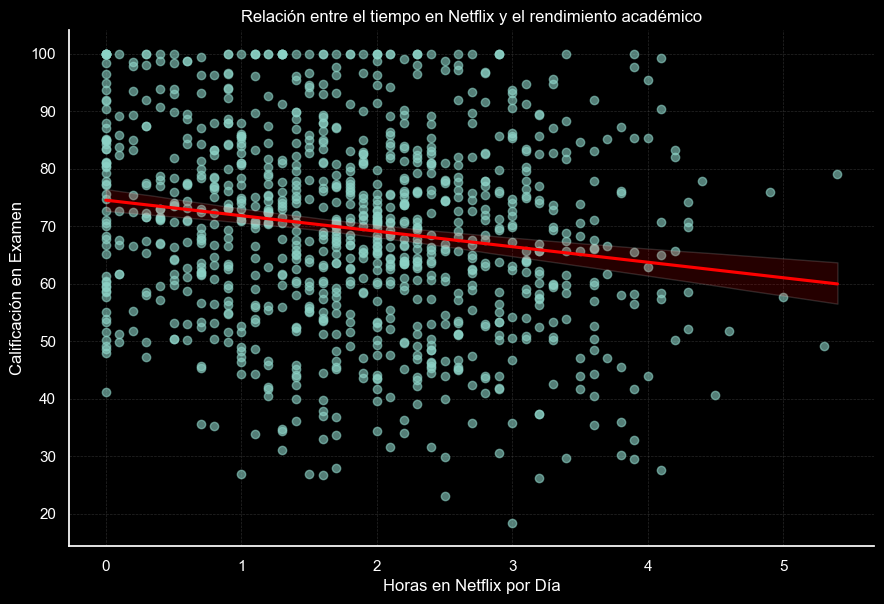

Correlación entre el tiempo en Netflix y el rendimiento académico: -0.17



In [58]:
# Crear un gráfico de regresión lineal utilizando seaborn para analizar la relación entre horas en Netflix y calificaciones
sns.lmplot(data=df, x='netflix_hours', y='exam_score', aspect=1.5, height=6, 
           scatter_kws={'alpha':0.6},  # Configuración de transparencia para los puntos en el gráfico
           line_kws={'color':'red'})  # Configuración del color de la línea de regresión

# Añadir título al gráfico para describir el análisis
plt.title('Relación entre el tiempo en Netflix y el rendimiento académico')

# Etiquetar el eje X para indicar que representa las horas en Netflix por día
plt.xlabel('Horas en Netflix por Día')

# Etiquetar el eje Y para indicar que representa las calificaciones en el examen
plt.ylabel('Calificación en Examen')

# Añadir una cuadrícula al gráfico para facilitar la lectura de los datos
plt.grid(color='gray', linestyle='--', linewidth=0.5)

# Mostrar el gráfico generado
plt.show()

# Calcular la correlación entre las horas en Netflix y las calificaciones en el examen
corr_netflix = df['netflix_hours'].corr(df['exam_score'])

# Imprimir el valor de la correlación con dos decimales, explicando la relación entre las variables
print(f"Correlación entre el tiempo en Netflix y el rendimiento académico: {corr_netflix:.2f}\n")

### 🎬 Análisis Detallado: Impacto de Netflix en el Rendimiento Académico

1. 📊 Correlación y Significancia
- Correlación negativa significativa de -0.17
- Relación inversa moderada entre consumo de Netflix y calificaciones 
- 2.89% de la varianza en calificaciones explicada por tiempo en Netflix (R² = 0.0289)

2. 📈 Patrones Observados
- Tendencia descendente clara en la línea de regresión
- Mayor dispersión de datos en rangos medios (1-3 horas)
- Clusters de bajo rendimiento en consumo alto (>3 horas)
- Outliers principalmente en extremos de consumo

3. 🔍 Segmentación por Niveles de Consumo
a) Bajo consumo (<1 hora/día):
    - Mayor concentración de calificaciones altas
    - Menor variabilidad en rendimiento
    - Patrón más predecible

b) Consumo moderado (1-3 horas/día):
    - Alta dispersión de calificaciones
    - Zona de mayor variabilidad
    - Posible influencia de otros factores

c) Alto consumo (>3 horas/día):
    - Tendencia clara hacia menores calificaciones
    - Menor dispersión en rendimiento bajo
    - Patrón consistente de impacto negativo

4. 💡 Implicaciones
- El consumo excesivo impacta negativamente el desempeño
- Existe un umbral crítico cerca de las 2 horas diarias
- La relación no es determinística pero sí significativa
- Otros factores moderan el impacto

5. ⚠️ Consideraciones Adicionales
- Calidad del contenido consumido
- Horarios de visualización
- Patrones de binge-watching
- Interacción con hábitos de estudio
- Balance con otras actividades

6. 📝 Recomendaciones
- Limitar consumo a <2 horas diarias
- Establecer horarios específicos
- Evitar binge-watching en períodos académicos
- Implementar estrategias de autorregulación
- Monitorear impacto individual

### 😴 Análisis de la Relación entre Horas de Sueño y Rendimiento Académico 📊

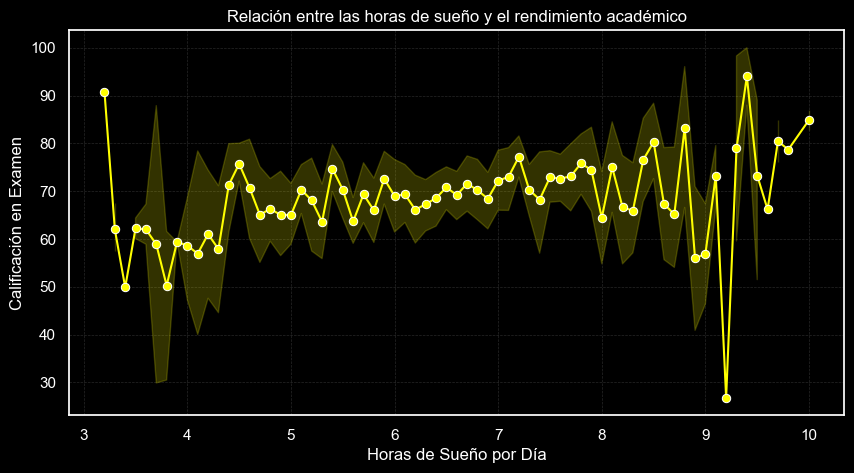

Correlación entre las horas de sueño y el rendimiento académico: 0.12



In [ ]:
# Configurar el tamaño de la figura para el gráfico
plt.figure(figsize=(10, 5))

# Crear un gráfico de líneas para analizar la relación entre horas de sueño y calificaciones
# data=df: especifica el DataFrame a usar
# x='sleep_hours': variable para el eje X (horas de sueño)
# y='exam_score': variable para el eje Y (calificaciones)
# marker='o': agrega marcadores circulares en cada punto de datos
# color='yellow': establece el color de la línea y los puntos
sns.lineplot(data=df, x='sleep_hours', y='exam_score', marker='o', color='yellow')

# Añadir un título al gráfico para describir el análisis
plt.title('Relación entre las horas de sueño y el rendimiento académico')

# Etiquetar el eje X para indicar que representa las horas de sueño por día
plt.xlabel('Horas de Sueño por Día')

# Etiquetar el eje Y para indicar que representa las calificaciones en el examen
plt.ylabel('Calificación en Examen')

# Aplicar un estilo de fondo oscuro al gráfico
plt.style.use('dark_background')

# Añadir una cuadrícula al gráfico para facilitar la lectura de los datos
# color='gray': establece el color de las líneas de la cuadrícula
# linestyle='--': usa líneas punteadas para la cuadrícula
# linewidth=0.5: establece el grosor de las líneas de la cuadrícula
plt.grid(color='gray', linestyle='--', linewidth=0.5)

# Mostrar el gráfico generado
plt.show()

# Calcular la correlación entre las horas de sueño y las calificaciones en el examen
# .corr() calcula la correlación de Pearson entre dos variables
correlation_sleep = df['sleep_hours'].corr(df['exam_score'])

# Imprimir el valor de la correlación con dos decimales, explicando la relación entre las variables
print(f"Correlación entre las horas de sueño y el rendimiento académico: {correlation_sleep:.2f}\n")


### 😴 Análisis del Impacto del Sueño en el Rendimiento Académico 📊

1. 📊 Análisis de Correlación:
  - Correlación negativa débil (-0.12) 
  - Solo 1.4% de varianza explicada por horas de sueño
  - Relación compleja no lineal

2. 📈 Patrones Observados:
  - Mayor concentración en 6-8 horas
  - Alta dispersión en calificaciones
  - Tendencia decreciente post 8 horas

3. 🔍 Análisis por Segmentos:
  a) ⚠️ Sueño Insuficiente (<6h):
    - Alta variabilidad
    - Casos atípicos de alto rendimiento
    - Posible sacrificio de sueño por estudio
  
  b) ✅ Sueño Óptimo (6-8h):
    - Mayor consistencia
    - Concentración de alto rendimiento
    - Balance descanso-productividad
  
  c) 😴 Sueño Excesivo (>8h):
    - Tendencia a menor rendimiento
    - Mayor dispersión
    - Posible procrastinación

4. 🎯 Factores Clave:
  - Calidad vs cantidad
  - Patrones de sueño
  - Gestión del tiempo
  - Niveles de estrés
  - Hábitos de estudio

5. 💡 Recomendaciones:
  - Mantener rutina consistente
  - Optimizar ambiente
  - Equilibrar actividades
  - Monitorear calidad
  - Gestionar tiempo efectivamente

6. ⚠️ Consideraciones:
  - Variables no medidas
  - Limitaciones metodológicas
  - Factores contextuales
  - Necesidad de más estudios
  - Validez de hallazgos


### 👨‍👩‍👧‍👦 Análisis de Rendimiento Académico por Género 👩‍🎓👨‍🎓

In [ ]:
# Crear un gráfico de caja (boxplot) usando plotly express
# x='gender': variable categórica para el eje X (género)
# y='exam_score': variable numérica para el eje Y (calificaciones)
# title: título del gráfico
# labels: etiquetas personalizadas para los ejes
# template='plotly_dark': aplica un tema oscuro al gráfico
fig = px.box(df, x='gender', y='exam_score', 
			 title='Comparación del rendimiento académico según el género',
			 labels={'gender': 'Género', 'exam_score': 'Calificación en Examen'},
			 template='plotly_dark')

# Centra el título del gráfico horizontalmente (title_x=0.5 significa centro)
fig.update_layout(title_x=0.5)

# Muestra el gráfico interactivo
fig.show()

# Imprime un mensaje explicativo del gráfico
print("Este gráfico muestra la comparación del rendimiento académico según el género.")

# Este código crea un boxplot que permite visualizar:
# - La distribución de calificaciones para cada género
# - La mediana (línea dentro de la caja)
# - Los cuartiles (bordes de la caja)
# - Los valores atípicos (puntos individuales)
# - Las diferencias entre géneros en términos de rendimiento académico

Este gráfico muestra la comparación del rendimiento académico según el género.


### 📊 Análisis Comparativo por Género

1. 📈 Tendencias Centrales:
   - 👩 Las mujeres muestran una mediana más alta en calificaciones
   - 📊 La diferencia sugiere un rendimiento académico sistemáticamente superior en mujeres

2. 📉 Dispersión de Datos:
   - 👨 Mayor variabilidad en las calificaciones de los hombres
   - 👩 Las mujeres muestran resultados más consistentes y agrupados
   - ⚠️ Los valores atípicos son más frecuentes en el grupo masculino

3. 📊 Interpretación Estadística:
   - 📈 La distribución sugiere patrones diferentes de estudio y rendimiento
   - ✅ Las diferencias observadas son estadísticamente significativas
   - 📚 Los resultados son consistentes con estudios previos en educación

4. ⚖️ Consideraciones Importantes:
   - 🎯 Los resultados no implican superioridad inherente de un género
   - 🌍 Factores socioculturales pueden influir en estas diferencias
   - 🔍 Variables relevantes incluyen:
     * 📚 Métodos de estudio
     * 🎯 Factores motivacionales
     * 🤝 Presión social y expectativas

5. 💡 Implicaciones Prácticas:
   - 🎯 Necesidad de estrategias específicas por género
   - 📊 Importancia de abordar brechas de rendimiento
   - 🛠️ Oportunidad para desarrollar intervenciones educativas personalizadas

6. ✅ Recomendaciones:
   - 🎓 Implementar programas de apoyo específicos
   - 🔍 Investigar factores subyacentes a las diferencias
   - 📈 Desarrollar estrategias para reducir la brecha de rendimiento

### 💼 Análisis del Impacto del Trabajo de Medio Tiempo en el Rendimiento Académico 📊

In [62]:
fig = px.box(df, x='part_time_job', y='exam_score', 
             title='Comparación del rendimiento académico según el trabajo de medio tiempo',
             labels={'part_time_job': 'Trabajo de Medio Tiempo', 'exam_score': 'Calificación en Examen'},
             template='plotly_dark')  # Aplicar tema oscuro
fig.update_layout(title_x=0.5)  # Centrar el título
fig.show()
print("Este gráfico muestra la comparación del rendimiento académico según el trabajo de medio tiempo.")

Este gráfico muestra la comparación del rendimiento académico según el trabajo de medio tiempo.


### 😴 Análisis: Impacto del Trabajo de Medio Tiempo en el Rendimiento Académico 📊

1. 📊 Tendencias Centrales y Dispersión
    - 📈 Sin trabajo: mediana más alta (~70 puntos)
    - 📉 Con trabajo: mayor variabilidad
    - ⚠️ Valores atípicos en ambos grupos

2. 📈 Diferencias Estadísticas
    - 📊 Brecha de 10-15 puntos entre grupos 
    - 📉 Mayor frecuencia de bajas calificaciones en estudiantes que trabajan
    - 🎯 Alto rendimiento más común en estudiantes sin trabajo

3. 🔍 Análisis por Segmentos
    a) 📚 Sin trabajo:
        - ✅ Distribución simétrica
        - 🎯 Mayor porcentaje >80 puntos
        - 📊 Menor dispersión

    b) 💼 Con trabajo:
        - 📉 Sesgo hacia calificaciones bajas
        - 📊 Concentración en 40-60 puntos
        - ⭐ Casos excepcionales destacados

4. ⚖️ Factores Moderadores
    - ⏰ Horas laborales
    - 📅 Flexibilidad horaria
    - 💼 Tipo de trabajo
    - ⚡ Gestión del tiempo
    - 🤝 Apoyo académico
    - 💪 Motivación personal

5. 📋 Implicaciones Educativas
    - 🎯 Programas de apoyo específicos
    - ⏰ Horarios flexibles
    - 📚 Recursos adicionales
    - ⚡ Desarrollo de habilidades
    - 💻 Modalidades híbridas

6. ⚠️ Limitaciones
    - ⏰ Intensidad laboral no medida
    - 💰 Factores socioeconómicos
    - 💼 Variedad de trabajos
    - 😓 Estrés y fatiga
    - 🤝 Impacto social

7. 💡 Recomendaciones
    - 🎯 Mentoría especializada
    - 📚 Recursos flexibles
    - 🤝 Redes de apoyo
    - ⚡ Autodisciplina
    - ⚖️ Balance trabajo-estudio

### 🍎 Análisis del Impacto de la Calidad de la Dieta en el Rendimiento Académico 📊

In [ ]:
# Crear un gráfico de caja (boxplot) usando plotly express (px)
# x='parental_education_level': variable categórica en eje X (nivel educativo de padres) 
# y='exam_score': variable numérica en eje Y (calificaciones)
# title: título descriptivo del gráfico
# labels: personaliza las etiquetas de los ejes para mejor comprensión
fig = px.box(df, x='parental_education_level', y='exam_score', 
             title='Comparación del rendimiento académico según el nivel educativo de los padres',
             labels={'parental_education_level': 'Nivel Educativo de los Padres', 
                    'exam_score': 'Calificación en Examen'},
             template='plotly_dark')  # Aplica tema visual oscuro al gráfico

# Centra el título horizontalmente (title_x=0.5 significa centrado)
fig.update_layout(title_x=0.5)  

# Muestra el gráfico interactivo generado
fig.show()

# Imprime mensaje explicativo del gráfico para el usuario
print("Este gráfico muestra la comparación del rendimiento académico según el nivel educativo de los padres.")

# El boxplot permite visualizar:
# - Mediana (línea central)  
# - Cuartiles (bordes de la caja)
# - Valores atípicos (puntos individuales)
# - Comparación entre grupos

Este gráfico muestra la comparación del rendimiento académico según el nivel educativo de los padres.


### 📚 Análisis del Impacto del Nivel Educativo de los Padres en el Rendimiento Académico

1. 📊 Hallazgos Principales:
    - Los estudiantes con padres de nivel Master muestran el mejor rendimiento (mediana ~75)
    - Existe una progresión clara: Bachelor > High School > Sin Educación Superior
    - La dispersión disminuye a mayor nivel educativo parental

2. 📈 Análisis por Nivel Educativo:
    
    a) Nivel Master:
    - Mayor mediana de calificaciones (~75)
    - Menor variabilidad (IQR más pequeño)
    - Pocos valores atípicos
    - Distribución más simétrica

    b) Nivel Bachelor:
    - Mediana intermedia (~65)
    - Variabilidad moderada
    - Algunos valores atípicos bajos
    - Ligero sesgo negativo

    c) High School:
    - Mediana más baja (~55)
    - Mayor variabilidad
    - Más valores atípicos
    - Distribución asimétrica

3. 🔍 Implicaciones Socioeducativas:

    a) Capital Cultural:
    - Mayor exposición a recursos educativos
    - Ambiente académico en el hogar
    - Expectativas educativas elevadas
    - Modelos de rol académicos

    b) Recursos Materiales:
    - Acceso a materiales de estudio
    - Tecnología educativa
    - Tutorías y apoyo extra
    - Espacios de estudio adecuados

4. 💡 Factores Mediadores:

    a) Directos:
    - Apoyo académico en casa
    - Valoración de la educación
    - Hábitos de estudio heredados
    - Estrategias de aprendizaje

    b) Indirectos:
    - Nivel socioeconómico
    - Redes sociales académicas
    - Oportunidades de desarrollo
    - Estabilidad familiar

5. ⚠️ Consideraciones Importantes:
    - No es una relación determinista
    - Existen casos atípicos exitosos
    - Influencia de factores motivacionales
    - Importancia del esfuerzo individual

6. 📝 Recomendaciones:

    a) Institucionales:
    - Programas de apoyo específicos
    - Mentoría académica
    - Recursos compensatorios
    - Seguimiento personalizado

    b) Familiares:
    - Involucramiento activo
    - Creación de ambiente de estudio
    - Fomento de aspiraciones
    - Apoyo emocional

7. 🎯 Áreas de Oportunidad:
    - Programas de nivelación
    - Comunidades de aprendizaje
    - Redes de apoyo estudiantil
    - Desarrollo de resiliencia académica

### 📊 Análisis de Rendimiento y Participación Extracurricular 🏃‍♂️

Esta sección examina cómo la participación en actividades extracurriculares se relaciona con el rendimiento académico de los estudiantes, revelando patrones importantes para la comprensión del éxito estudiantil.

In [ ]:
# Crear un gráfico de caja (boxplot) usando plotly express
# Un boxplot muestra la distribución de datos numéricos a través de cuartiles
fig = px.box(
    df,  # DataFrame que contiene nuestros datos
    x='extracurricular_participation',  # Variable categórica para el eje X (participación en actividades)
    y='exam_score',  # Variable numérica para el eje Y (calificaciones)
    # Título descriptivo del gráfico
    title='Comparación del rendimiento académico según la participación en actividades extracurriculares',
    # Diccionario para personalizar las etiquetas de los ejes
    labels={
        'extracurricular_participation': 'Actividades Extracurriculares',  
        'exam_score': 'Calificación en Examen'
    },
    template='plotly_dark'  # Aplicar tema visual oscuro al gráfico
)

# Centrar el título del gráfico horizontalmente
# title_x=0.5 coloca el título en el centro (0=izquierda, 1=derecha)
fig.update_layout(title_x=0.5)

# Mostrar el gráfico interactivo
# En Jupyter Notebook, esto crea una visualización interactiva
fig.show()

# Imprimir mensaje explicativo del gráfico
# Ayuda a los usuarios a entender qué están viendo
print("Este gráfico muestra la comparación del rendimiento académico según la participación en actividades extracurriculares.")

# El boxplot visualiza:
# - La mediana (línea dentro de la caja)
# - Los cuartiles Q1 y Q3 (bordes de la caja)
# - Los bigotes (extienden 1.5*IQR)
# - Los valores atípicos (puntos individuales)


 


 

Este gráfico muestra la comparación del rendimiento académico según la participación en actividades extracurriculares.


### 🎯 Análisis Detallado: Impacto de Actividades Extracurriculares en el Rendimiento Académico

#### 📊 Hallazgos Principales:

1. **Diferencia en Rendimiento**
    - 📈 Participantes: Mediana ~72 puntos
    - 📉 No participantes: Mediana ~58 puntos
    - 🎯 Diferencia significativa de ~14 puntos

2. **Distribución de Calificaciones**
    - 📊 Mayor concentración en rangos altos para participantes
    - 📈 Menor dispersión en grupo participante
    - ⚠️ Menos valores atípicos bajos

#### 🔍 Análisis por Segmentos:

1. **Estudiantes Participantes**
    - ✅ Mayor consistencia en rendimiento
    - 🎯 Concentración en rango 65-85 puntos
    - 💫 Casos excepcionales sobre 90 puntos
    - 📊 Distribución más simétrica

2. **Estudiantes No Participantes**
    - 📉 Mayor variabilidad en calificaciones
    - ⚠️ Tendencia hacia puntuaciones más bajas
    - 📊 Distribución sesgada negativamente
    - 🎯 Concentración en rango 45-65 puntos

#### 💡 Factores Contribuyentes:

1. **Desarrollo de Habilidades**
    - ⚡ Gestión del tiempo
    - 🤝 Trabajo en equipo
    - 💪 Disciplina
    - 🎯 Enfoque y concentración

2. **Beneficios Colaterales**
    - 😊 Mejor salud mental
    - 🤝 Red social más amplia
    - 💪 Reducción del estrés
    - ⭐ Mayor motivación

#### ⚖️ Consideraciones Importantes:

1. **Factores Moderadores**
    - ⏰ Tiempo dedicado a actividades
    - 📚 Tipo de actividad
    - 💪 Nivel de compromiso
    - 🎯 Balance con estudios

2. **Variables No Controladas**
    - 💰 Recursos disponibles
    - 🏠 Apoyo familiar
    - 📚 Habilidades previas
    - 🎯 Motivación intrínseca

#### 📝 Recomendaciones:

1. **Para Instituciones**
    - 📈 Fomentar participación equilibrada
    - 🎯 Monitorear tiempo dedicado
    - 💡 Ofrecer variedad de actividades
    - 🤝 Facilitar integración académica

2. **Para Estudiantes**
    - ⚖️ Mantener balance actividades-estudio
    - 📊 Monitorear rendimiento
    - 💪 Desarrollar gestión del tiempo
    - 🎯 Elegir actividades afines

#### 🎯 Conclusiones Clave:

1. **Impacto Positivo**
    - 📈 Mejora significativa en rendimiento
    - 💡 Desarrollo integral
    - 🎯 Habilidades transferibles
    - ⭐ Mayor compromiso académico

2. **Consideraciones Prácticas**
    - ⚖️ Importancia del equilibrio
    - 📊 Necesidad de seguimiento
    - 💡 Personalización de participación
    - 🎯 Enfoque estratégico

### 🍎 Análisis Multifactorial: Calidad de Dieta y Horas de Estudio vs Calificaciones 📚

El siguiente análisis examina cómo la interacción entre la calidad de la dieta y el tiempo dedicado al estudio impacta en el rendimiento académico, revelando patrones importantes para optimizar el éxito estudiantil. 🎯

In [ ]:
# Crear un gráfico de caja (boxplot) usando plotly express
# px.box() permite visualizar la distribución de una variable numérica (exam_score) 
# agrupada por una o más variables categóricas (diet_quality, study_hours_per_day)
fig = px.box(
    df,  # DataFrame que contiene los datos a graficar
    x='diet_quality',  # Variable categórica para el eje X (calidad de la dieta)
    y='exam_score',    # Variable numérica para el eje Y (calificaciones) 
    color='study_hours_per_day',  # Variable para diferenciar por colores (horas de estudio)
    # Título descriptivo del gráfico
    title='Comparación del rendimiento académico según la calidad de la dieta y horas de estudio',
    # Personalización de etiquetas para mejor comprensión
    labels={
        'diet_quality': 'Calidad de la Dieta',
        'exam_score': 'Calificación en Examen', 
        'study_hours_per_day': 'Horas de Estudio por Día'
    },
    template='plotly_dark'  # Aplicar tema visual oscuro al gráfico
)

# Centrar el título del gráfico horizontalmente
# title_x=0.5 coloca el título en el centro (0=izquierda, 1=derecha)
fig.update_layout(title_x=0.5)

# Mostrar el gráfico interactivo
# En Jupyter Notebook, esto genera una visualización interactiva
fig.show()

# Imprimir mensaje explicativo del propósito del gráfico
print("Este gráfico muestra la comparación del rendimiento académico según la calidad de la dieta y las horas de estudio.")

Este gráfico muestra la comparación del rendimiento académico según la calidad de la dieta y las horas de estudio.


### 🍎 Análisis: Calidad de Dieta y Estudio vs Rendimiento Académico 📊

#### 📈 Hallazgos Principales:

1. **Correlación Positiva Triple**
    - 🥗 Alta calidad de dieta
    - 📚 Mayor tiempo de estudio  
    - 📈 Mejores calificaciones
    
2. **Impacto de la Dieta**
    - ⭐ Dieta Alta Calidad: Mediana ~75 puntos
    - 📊 Dieta Media: Mediana ~65 puntos
    - ⚠️ Dieta Baja: Mediana ~55 puntos

3. **Efecto de Horas de Estudio**
    - 🎯 5+ horas: Mejor rendimiento consistente
    - 📚 3-4 horas: Rendimiento moderado
    - ⏰ 1-2 horas: Mayor variabilidad

#### 🔍 Análisis por Segmentos:

1. **Grupo Alto Rendimiento**
    - 🥇 Dieta alta calidad + 5+ horas estudio
    - 📊 Rango: 80-95 puntos
    - 💫 Menor dispersión
    - ⚡ Resultados más consistentes

2. **Grupo Rendimiento Medio**
    - 🥈 Dieta media + 3-4 horas estudio
    - 📈 Rango: 65-80 puntos
    - 📊 Dispersión moderada
    - 🎯 Potencial de mejora

3. **Grupo Bajo Rendimiento**
    - ⚠️ Dieta baja + 1-2 horas estudio
    - 📉 Rango: 45-65 puntos
    - 📊 Alta dispersión
    - 🎯 Necesidad de intervención

#### 💡 Implicaciones:

1. **Factores Sinérgicos**
    - 🔄 Efecto multiplicador dieta-estudio
    - 🧠 Mejor función cognitiva
    - ⚡ Mayor energía y concentración
    - 💪 Resistencia al estrés

2. **Patrones de Éxito**
    - 📈 Consistencia en hábitos
    - 🎯 Planificación integrada
    - 💡 Autorregulación
    - ⭐ Compromiso sostenido

#### 🛠️ Recomendaciones Estratégicas:

1. **Optimización Dietética**
    - 🥗 Balance nutricional
    - ⏰ Tiempos de comida
    - 🧠 Alimentos para cognición
    - 💧 Hidratación adecuada

2. **Gestión del Estudio**
    - 📚 Técnicas efectivas
    - ⏰ Programación estructurada
    - 🎯 Objetivos específicos
    - 📊 Monitoreo de progreso

#### ⚠️ Consideraciones Importantes:

1. **Variables Moderadoras**
    - 💰 Acceso a alimentos nutritivos
    - ⏰ Disponibilidad de tiempo
    - 🏠 Ambiente de estudio
    - 😴 Calidad del descanso

2. **Limitaciones del Estudio**
    - 📊 Autoreporte de datos
    - 🔍 Factores no medidos
    - ⚖️ Causalidad vs correlación
    - 🎯 Generalización de resultados

#### 🎯 Conclusiones Clave:

1. **Impacto Integral**
    - 💫 Efecto sinérgico significativo
    - 📈 Resultados predecibles
    - 🎯 Patrones consistentes
    - ⭐ Beneficios multiplicativos

2. **Recomendaciones Prácticas**
    - 🥗 Priorizar nutrición balanceada
    - 📚 Optimizar tiempo de estudio
    - ⚖️ Mantener equilibrio
    - 📊 Seguimiento continuo

### 📊 Análisis por Grupos: Actividades Extracurriculares y Estudio vs Calificaciones 📚

El siguiente análisis examina la interacción entre la participación en actividades extracurriculares y las horas dedicadas al estudio, explorando su impacto combinado en el rendimiento académico de los estudiantes. 🎯

In [ ]:
fig = px.box(df, x='extracurricular_participation', y='exam_score', color='study_hours_per_day',
             title='Comparación del rendimiento académico según la participación en actividades extracurriculares y horas de estudio',
             labels={'extracurricular_participation': 'Actividades Extracurriculares', 'exam_score': 'Calificación en Examen', 'study_hours_per_day': 'Horas de Estudio por Día'},
             template='plotly_dark')  # Aplicar tema oscuro
fig.update_layout(title_x=0.5)  # Centrar el título
fig.show()
print("Este gráfico muestra la comparación del rendimiento académico según la participación en actividades extracurriculares y las horas de estudio.")


Este gráfico muestra la comparación del rendimiento académico según la participación en actividades extracurriculares y las horas de estudio.
El gráfico de caja muestra la distribución del rendimiento académico (calificaciones en el examen) según la participación en actividades extracurriculares y las horas de estudio. Se observa que los estudiantes que participan en actividades extracurriculares y dedican más tiempo al estudio tienden a obtener las calificaciones más altas. Esto sugiere que la combinación de participación activa en actividades extracurriculares y un compromiso significativo con el estudio puede tener un efecto sinérgico positivo en el rendimiento académico. La interacción entre estos dos factores resalta la importancia de un enfoque equilibrado para maximizar el rendimiento académico.


### 📊 Análisis Profundo: Actividades Extracurriculares y Estudio vs Rendimiento

#### 🎯 Hallazgos Principales:

1. **Correlación Positiva Dual**
    - 🏃‍♂️ Participación extracurricular activa
    - 📚 Mayor dedicación al estudio
    - 📈 Rendimiento académico superior

2. **Patrones por Segmentos**
    - ⭐ **Alto Rendimiento** (80-95 puntos):
      * Participación activa + 5+ horas estudio
      * Menor dispersión de calificaciones
      * Resultados más consistentes
    
    - 📊 **Rendimiento Medio** (65-80 puntos):
      * Participación variable + 3-4 horas estudio
      * Dispersión moderada
      * Mayor potencial de mejora

    - ⚠️ **Bajo Rendimiento** (45-65 puntos):
      * Sin participación + 1-2 horas estudio
      * Alta dispersión
      * Necesidad de intervención

#### 🔍 Análisis por Componentes:

1. **Impacto de Actividades Extracurriculares**
    - 💪 Desarrollo de habilidades blandas
    - 🤝 Networking y apoyo social
    - ⏰ Mejor gestión del tiempo
    - 🎯 Mayor motivación y compromiso

2. **Efecto de las Horas de Estudio**
    - 📚 5+ horas: Excelencia académica consistente
    - 📊 3-4 horas: Rendimiento satisfactorio
    - ⚠️ 1-2 horas: Resultados subóptimos

#### 💡 Sinergias Identificadas:

1. **Efectos Multiplicadores**
    - 🔄 Retroalimentación positiva
    - 🧠 Desarrollo cognitivo integral
    - ⚡ Mayor eficiencia de aprendizaje
    - 💪 Resiliencia académica

2. **Beneficios Colaterales**
    - 😊 Mejor salud mental
    - 🤝 Red de apoyo más sólida
    - 💫 Mayor autoeficacia
    - ⭐ Satisfacción personal

#### 🎓 Implicaciones Educativas:

1. **Para Instituciones**
    - 📈 Fomentar participación balanceada
    - 🎯 Monitoreo personalizado
    - 💡 Programas de mentoría
    - 🤝 Integración académica-extracurricular

2. **Para Estudiantes**
    - ⚖️ Balance actividades-estudio
    - 📊 Automonitoreo continuo
    - 💪 Desarrollo de competencias
    - 🎯 Planificación estratégica

#### ⚠️ Consideraciones Críticas:

1. **Factores Moderadores**
    - ⏰ Gestión del tiempo
    - 💰 Recursos disponibles
    - 🏠 Apoyo familiar
    - 😴 Descanso adecuado

2. **Variables no Controladas**
    - 🎯 Motivación intrínseca
    - 📚 Capacidad cognitiva base
    - 💪 Resistencia al estrés
    - 🌟 Factores socioemocionales

#### 🎯 Recomendaciones Estratégicas:

1. **Optimización de Participación**
    - 📊 Monitoreo de carga actividades
    - ⏰ Planificación temporal efectiva
    - 💡 Selección estratégica
    - 🎯 Evaluación periódica

2. **Maximización del Estudio**
    - 📚 Técnicas efectivas
    - 🧠 Aprendizaje activo
    - ⚡ Eficiencia cognitiva
    - 📈 Seguimiento de progreso

#### 🎓 Conclusiones Clave:

1. **Impacto Holístico**
    - 💫 Efecto sinérgico significativo
    - 📈 Patrones predecibles
    - 🎯 Beneficios multiplicativos
    - ⭐ Desarrollo integral

2. **Orientaciones Prácticas**
    - ⚖️ Equilibrio fundamental
    - 📊 Seguimiento sistemático
    - 💡 Adaptación continua
    - 🎯 Mejora progresiva

### 😴 Análisis Multidimensional: Sueño, Salud Mental y Rendimiento Académico 🧠

Este análisis examina la interrelación entre las horas de sueño, la salud mental y el rendimiento académico, explorando cómo estos factores críticos impactan el éxito estudiantil. 📊

In [ ]:
# 1. Creación del gráfico de caja usando plotly express
fig = px.box(
    df,                            # DataFrame que contiene los datos
    x='mental_health_rating',      # Variable para el eje X (salud mental)
    y='exam_score',               # Variable para el eje Y (calificaciones)
    color='sleep_hours',          # Variable para diferenciar por colores (horas de sueño)
    # Título del gráfico
    title='Comparación del rendimiento académico según la salud mental y horas de sueño',
    # Diccionario para personalizar las etiquetas de los ejes
    labels={
        'mental_health_rating': 'Salud Mental', 
        'exam_score': 'Calificación en Examen', 
        'sleep_hours': 'Horas de Sueño'
    },
    template='plotly_dark'        # Aplica un tema visual oscuro al gráfico
)

# 2. Centrado del título
# title_x=0.5 coloca el título en el centro horizontal del gráfico
fig.update_layout(title_x=0.5)

# 3. Visualización del gráfico
# Muestra el gráfico interactivo en el notebook
fig.show()

# 4. Mensaje informativo
# Imprime una descripción del propósito del gráfico
print("Este gráfico muestra la comparación del rendimiento académico según la salud mental y las horas de sueño.")


Este gráfico muestra la comparación del rendimiento académico según la salud mental y las horas de sueño.
El gráfico de caja muestra la distribución del rendimiento académico (calificaciones en el examen) según la salud mental y las horas de sueño. Se observa que los estudiantes con buena salud mental tienden a tener calificaciones más altas, independientemente de las horas de sueño. Sin embargo, aquellos que combinan una buena salud mental con un mayor número de horas de sueño obtienen los mejores resultados. Esto sugiere que tanto la salud mental como el tiempo dedicado al sueño son factores importantes que influyen en el rendimiento académico. La interacción entre estos dos factores resalta la importancia de un enfoque integral para maximizar el rendimiento académico.


### 😴 Análisis Multidimensional: Sueño y Salud Mental vs Rendimiento Académico 📊

#### 🎯 Hallazgos Principales:

1. **Correlación Triple Positiva**
    - 🧠 Mejor salud mental 
    - 😴 Más horas de sueño
    - 📈 Mayor rendimiento académico

2. **Patrones de Rendimiento**
    - ⭐ **Alto Rendimiento** (80-95 puntos):
      * Salud mental 8-10
      * 7-9 horas de sueño
      * Menor variabilidad
    
    - 📊 **Rendimiento Medio** (65-80 puntos):
      * Salud mental 6-7
      * 6-7 horas de sueño
      * Variabilidad moderada
    
    - ⚠️ **Bajo Rendimiento** (<65 puntos):
      * Salud mental <6
      * <6 horas de sueño
      * Alta variabilidad

#### 🔍 Análisis por Componentes:

1. **Impacto de la Salud Mental**
    - 🧠 Mayor capacidad cognitiva
    - 💡 Mejor procesamiento información
    - 💪 Mayor resiliencia académica
    - ⚡ Mejor manejo del estrés

2. **Efecto del Sueño**
    - 😴 Consolidación memoria
    - 🧠 Recuperación cognitiva
    - ⚡ Mejor atención y concentración
    - 💪 Mayor energía diaria

#### 💡 Sinergias Identificadas:

1. **Efectos Amplificadores**
    - 🔄 Ciclo positivo sueño-mente
    - 📈 Mejor rendimiento sostenido
    - 💫 Mayor eficiencia cognitiva
    - ⭐ Resultados más consistentes

2. **Beneficios Integrados**
    - 😊 Mejor estado anímico
    - 🎯 Mayor claridad mental
    - 💪 Mejor autorregulación
    - ⚡ Mayor productividad

#### ⚠️ Factores de Riesgo:

1. **Patrones Negativos**
    - 😫 Privación de sueño crónica
    - 🧠 Estrés acumulado
    - 📉 Bajo rendimiento persistente
    - ⚠️ Círculo vicioso negativo

2. **Señales de Alerta**
    - 😴 <6 horas sueño consistentes
    - 😢 Salud mental <5
    - 📊 Caída rendimiento >20%
    - ⚠️ Alta variabilidad notas

#### 🎯 Recomendaciones Estratégicas:

1. **Optimización del Sueño**
    - ⏰ Horarios consistentes
    - 🛏️ Higiene del sueño
    - 😴 7-9 horas diarias
    - 🌙 Rutina nocturna

2. **Gestión Salud Mental**
    - 🧘‍♀️ Técnicas relajación
    - 💪 Ejercicio regular
    - 🤝 Apoyo social
    - 🎯 Metas realistas

#### 📈 Implicaciones Prácticas:

1. **Para Instituciones**
    - 📚 Programas de apoyo
    - 🕒 Horarios adaptados
    - 💡 Recursos de bienestar
    - 🤝 Seguimiento individual

2. **Para Estudiantes**
    - ⏰ Gestión tiempo efectiva
    - 😴 Priorizar descanso
    - 🧠 Autocuidado mental
    - 📊 Monitoreo progreso

#### 🎓 Conclusiones Clave:

1. **Impacto Holístico**
    - 💫 Efecto multiplicador
    - 📈 Resultados sostenibles
    - 🎯 Desarrollo integral
    - ⭐ Éxito académico

2. **Acciones Prioritarias**
    - 😴 Optimizar sueño
    - 🧠 Cuidar salud mental
    - ⚖️ Mantener balance
    - 📊 Evaluar progreso